In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Charger les données depuis le CSV
df = pd.read_csv('eco2mix-regional-tr.csv',
                 sep=',',  # Séparateur souvent ';' dans les CSV français
                 parse_dates=['Date - Heure'],  # Colonne datetime
                 dayfirst=True)  # Format jour/mois
print(df.isna().sum())


<ipython-input-18-04d651284a22>:6: DtypeWarning:

Columns (12) have mixed types. Specify dtype option on import or set low_memory=False.

<ipython-input-18-04d651284a22>:6: UserWarning:

Parsing dates in %Y-%m-%dT%H:%M:%S%z format when dayfirst=True was specified. Pass `dayfirst=False` or specify a format to silence this warning.



Code INSEE région           0
Région                      0
Nature                      0
Date                        0
Heure                       0
Date - Heure                0
Consommation (MW)         617
Thermique (MW)            308
Nucléaire (MW)          22382
Eolien (MW)               288
Solaire (MW)              289
Hydraulique (MW)          304
Pompage (MW)              288
Bioénergies (MW)          302
Ech. physiques (MW)       616
Stockage batterie         288
Déstockage batterie       288
TCO Thermique (%)        2026
TCH Thermique (%)         308
TCO Nucléaire (%)       23905
TCH Nucléaire (%)      371690
TCO Eolien (%)           2026
TCH Eolien (%)            288
TCO Solaire (%)          2026
TCH Solaire (%)           289
TCO Hydraulique (%)      2026
TCH Hydraulique (%)       304
TCO Bioénergies (%)      2026
TCH Bioénergies (%)       302
Année                       0
Mois                        0
Jour                        0
dtype: int64


<ipython-input-12-5f65642068fc>:16: FutureWarning:

Support for nested sequences for 'parse_dates' in pd.read_csv is deprecated. Combine the desired columns with pd.to_datetime after parsing instead.

<ipython-input-12-5f65642068fc>:16: DtypeWarning:

Columns (12) have mixed types. Specify dtype option on import or set low_memory=False.

<ipython-input-12-5f65642068fc>:16: UserWarning:

Parsing dates in %Y %m %d format when dayfirst=True was specified. Pass `dayfirst=False` or specify a format to silence this warning.



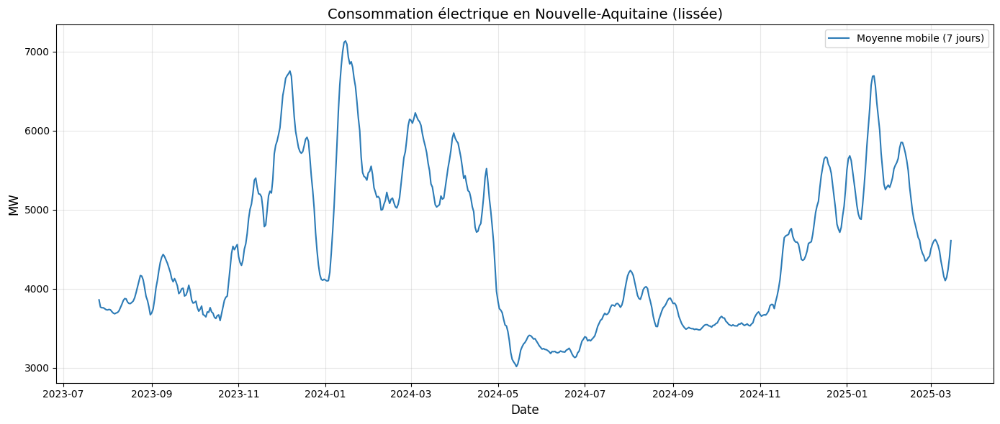

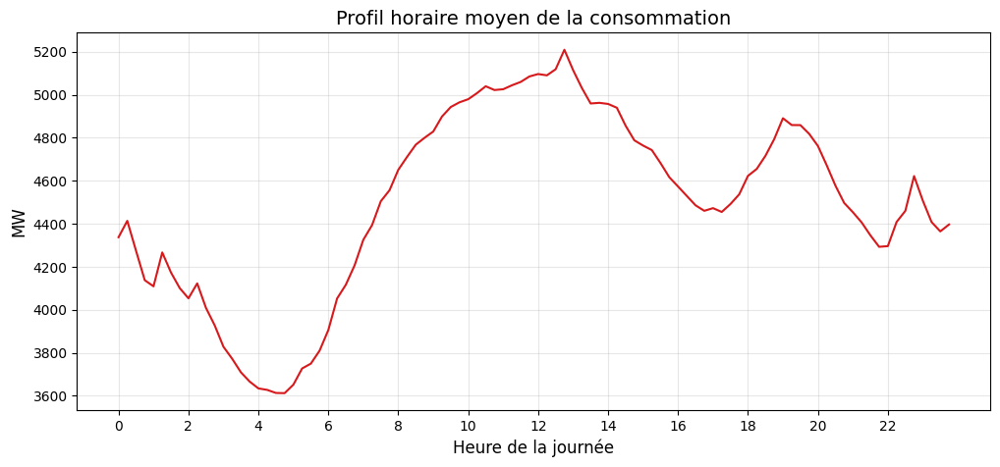

<Figure size 1200x600 with 0 Axes>

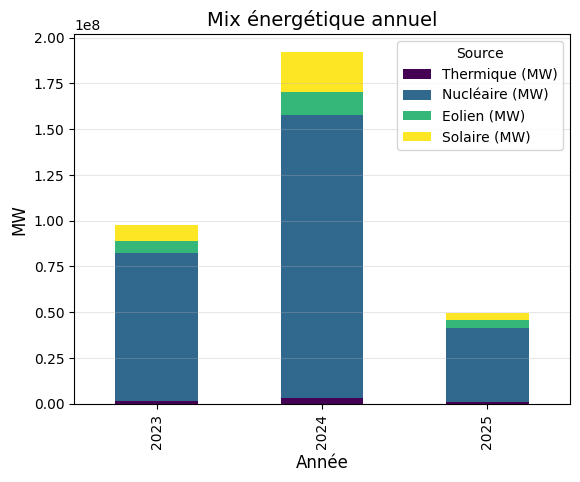


Performance du modèle :
- MAE : 655.66 MW
- RMSE : 834.77 MW


In [12]:
# -*- coding: utf-8 -*-
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import Ridge
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error

# ----------------------------------------------------------------------------------
# 1. Chargement des données
# ----------------------------------------------------------------------------------
def load_data():
    """Charge les données avec le format validé"""
    df = pd.read_csv(
        'eco2mix-regional-tr.csv',
        sep=',',
        dtype={'Heure': str},
        parse_dates={'datetime': ['Année', 'Mois', 'Jour']},
        dayfirst=True,
        na_values=['-', 'n/d']
    )

    # Gestion des heures
    heures = df['Heure'].str.split(':', expand=True).fillna('00')
    df['datetime'] += pd.to_timedelta(heures[0].astype(int), unit='h') + pd.to_timedelta(heures[1].astype(int), unit='m')

    return df[df['Région'] == 'Nouvelle-Aquitaine']  # Filtrage

# ----------------------------------------------------------------------------------
# 2. Feature Engineering
# ----------------------------------------------------------------------------------
def process_features(df):
    """Crée les variables utiles pour le modèle"""
    # Variables temporelles
    df['Heure_decimale'] = df['datetime'].dt.hour + df['datetime'].dt.minute / 60
    df['Jour_semaine'] = df['datetime'].dt.weekday
    df['Mois'] = df['datetime'].dt.month  # Nouveau : Mois pour les analyses saisonnières

    # Part renouvelable
    renouvelables = ['Eolien (MW)', 'Solaire (MW)', 'Hydraulique (MW)', 'Bioénergies (MW)']
    df['Part_renouvelable'] = df[renouvelables].sum(axis=1) / df[['Thermique (MW)', 'Nucléaire (MW)'] + renouvelables].sum(axis=1)
    df['Part_renouvelable'] = df['Part_renouvelable'].fillna(0)

    return df.dropna()

# ----------------------------------------------------------------------------------
# 3. Visualisations Améliorées
# ----------------------------------------------------------------------------------
def plot_consumption_smoothed(df):
    """Consommation lissée avec moyenne mobile sur 7 jours"""
    plt.figure(figsize=(14, 6))

    # Lissage des données
    df_weekly = df.set_index('datetime')['Consommation (MW)'].resample('D').mean().rolling(window=7).mean()

    plt.plot(df_weekly.index, df_weekly, color='#2c7bb6', linewidth=1.5, label='Moyenne mobile (7 jours)')
    plt.title('Consommation électrique en Nouvelle-Aquitaine (lissée)', fontsize=14)
    plt.xlabel('Date', fontsize=12)
    plt.ylabel('MW', fontsize=12)
    plt.grid(alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

def plot_hourly_pattern(df):
    """Profil horaire moyen de la consommation"""
    plt.figure(figsize=(12, 5))
    sns.lineplot(
        x='Heure_decimale',
        y='Consommation (MW)',
        data=df,
        color='#d7191c',
        estimator='mean',
        errorbar=None
    )
    plt.title('Profil horaire moyen de la consommation', fontsize=14)
    plt.xlabel('Heure de la journée', fontsize=12)
    plt.ylabel('MW', fontsize=12)
    plt.xticks(np.arange(0, 24, 2))
    plt.grid(alpha=0.3)
    plt.show()

def plot_energy_mix(df):
    """Répartition annuelle de la production"""
    plt.figure(figsize=(12, 6))

    # Agrégation annuelle
    df_yearly = df.groupby(df['datetime'].dt.year)[
        ['Thermique (MW)', 'Nucléaire (MW)', 'Eolien (MW)', 'Solaire (MW)']
    ].sum()

    df_yearly.plot(kind='bar', stacked=True, colormap='viridis')
    plt.title('Mix énergétique annuel', fontsize=14)
    plt.xlabel('Année', fontsize=12)
    plt.ylabel('MW', fontsize=12)
    plt.legend(title='Source')
    plt.grid(alpha=0.3, axis='y')
    plt.show()

# ----------------------------------------------------------------------------------
# 4. Entraînement du modèle et métriques
# ----------------------------------------------------------------------------------
def train_and_evaluate(df):
    """Entraîne le modèle et retourne MAE/RMSE"""
    features = ['Heure_decimale', 'Jour_semaine', 'Thermique (MW)', 'Part_renouvelable']
    target = 'Consommation (MW)'

    X = df[features]
    y = df[target]

    # Split des données
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Normalisation
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # Modèle
    model = Ridge(alpha=0.5)
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)

    # Calcul des métriques
    mae = mean_absolute_error(y_test, predictions)
    rmse = np.sqrt(mean_squared_error(y_test, predictions))

    print(f"\nPerformance du modèle :")
    print(f"- MAE : {mae:.2f} MW")
    print(f"- RMSE : {rmse:.2f} MW")

# ----------------------------------------------------------------------------------
# Exécution
# ----------------------------------------------------------------------------------
if __name__ == "__main__":
    # Chargement et traitement
    df = load_data().pipe(process_features)

    # Visualisations
    plot_consumption_smoothed(df)
    plot_hourly_pattern(df)
    plot_energy_mix(df)

    # Entraînement et résultats
    train_and_evaluate(df)

In [ ]:
import pandas as pd

# Charger le fichier CSV
file_path = "/content/eco2mix-regional-tr.csv"  # Remplace par le bon chemin
df = pd.read_csv(file_path, sep=";")  # Adapter le séparateur si nécessaire

# Transformer la colonne 'Date' en trois colonnes
df[['Année', 'Mois', 'Jour']] = df['Date'].str.split('-', expand=True)

# Sauvegarder le fichier modifié
df.to_csv("/content/eco2mix-regional-tr.csv", sep=";", index=False)


<ipython-input-10-f780d851893b>:5: DtypeWarning: Columns (12) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path, sep=";")  # Adapter le séparateur si nécessaire


<ipython-input-12-1bcbd2f1d5e6>:6: DtypeWarning: Columns (12) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path, sep=";")  # Adapter le séparateur si nécessaire


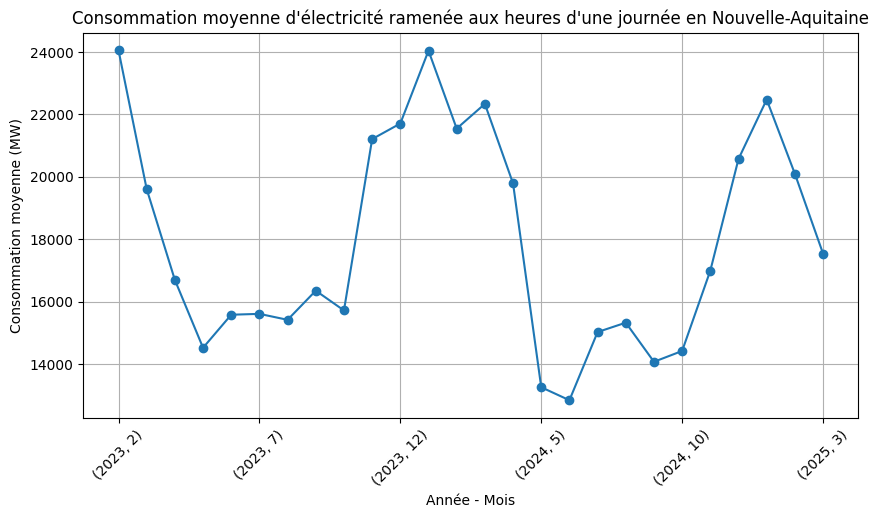

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Charger le fichier CSV modifié
file_path = "/content/eco2mix-regional-tr.csv"
df = pd.read_csv(file_path, sep=";")

# Convertir les colonnes 'Année', 'Mois' en entiers (au cas où elles sont en str)
df[['Année', 'Mois', 'Jour']] = df[['Année', 'Mois', 'Jour']].astype(int)

# Filtrer les données pour la région Nouvelle-Aquitaine
df_na = df[df['Région'] == "Nouvelle-Aquitaine"]

# Calculer la consommation totale par mois et le nombre de jours par mois
consommation_mensuelle = df_na.groupby(['Année', 'Mois'])['Consommation (MW)'].sum()
jours_par_mois = df_na.groupby(['Année', 'Mois'])['Jour'].nunique()

# Ramener la consommation moyenne à une journée de 24h
consommation_journalière_moyenne = (consommation_mensuelle / jours_par_mois) / 24

# Tracer le graphique
plt.figure(figsize=(10, 5))
consommation_journalière_moyenne.plot(marker='o', linestyle='-')

plt.title("Consommation moyenne d'électricité ramenée aux heures d'une journée en Nouvelle-Aquitaine")
plt.xlabel("Année - Mois")
plt.ylabel("Consommation moyenne (MW)")
plt.grid(True)
plt.xticks(rotation=45)  # Rotation des étiquettes pour une meilleure lisibilité
plt.show()

<ipython-input-14-de9cffbcfd47>:7: DtypeWarning: Columns (12) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path, sep=";")  # Adapter le séparateur si nécessaire


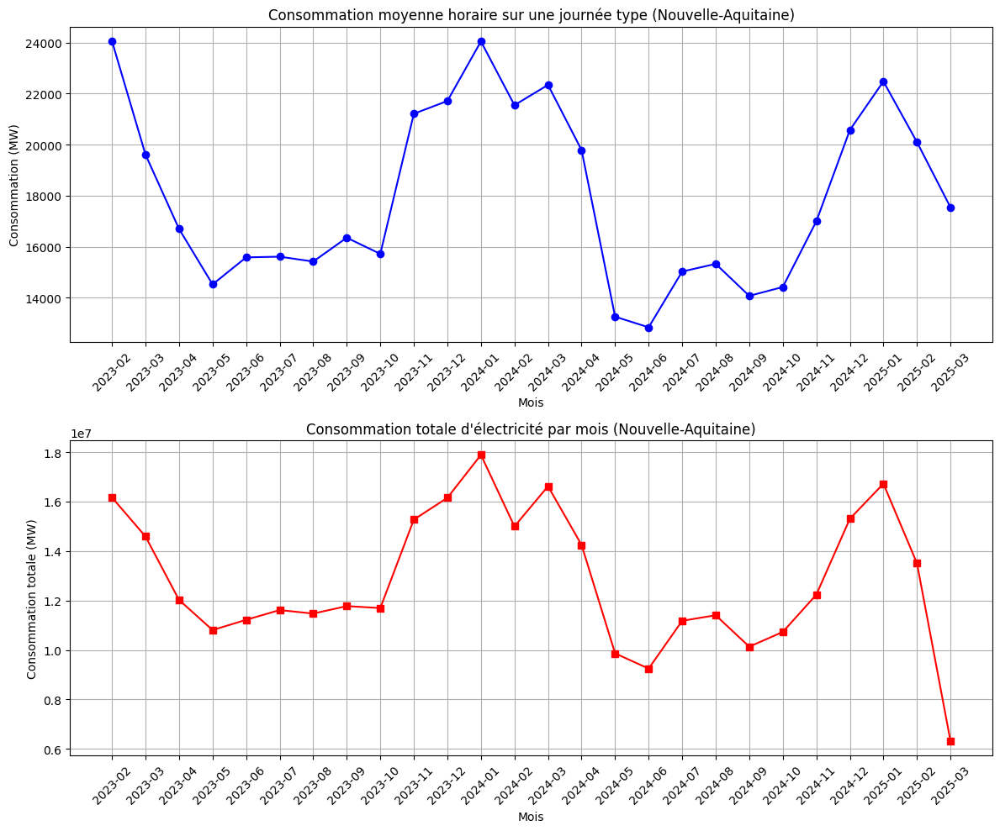

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Charger le fichier CSV modifié
file_path = "/content/eco2mix-regional-tr.csv"
df = pd.read_csv(file_path, sep=";")

# Convertir les colonnes 'Année', 'Mois', 'Jour' en entiers (au cas où elles sont en str)
df[['Année', 'Mois', 'Jour']] = df[['Année', 'Mois', 'Jour']].astype(int)

# Filtrer les données pour la région Nouvelle-Aquitaine
df_na = df[df['Région'] == "Nouvelle-Aquitaine"]

# Calculer la consommation totale par mois
consommation_mensuelle = df_na.groupby(['Année', 'Mois'])['Consommation (MW)'].sum()

# Calculer le nombre de jours uniques par mois
jours_par_mois = df_na.groupby(['Année', 'Mois'])['Jour'].nunique()

# Ramener la consommation mensuelle à une journée type de 24h
consommation_horaire_moyenne = (consommation_mensuelle / jours_par_mois) / 24

# Création des labels pour l'axe X
mois_labels = [f"{annee}-{mois:02d}" for annee, mois in consommation_mensuelle.index]

# Création des graphiques
fig, axes = plt.subplots(2, 1, figsize=(12, 10))

# Graphique 1 : Consommation moyenne horaire sur une journée type
axes[0].plot(mois_labels, consommation_horaire_moyenne, marker='o', linestyle='-', color='b')
axes[0].set_title("Consommation moyenne horaire sur une journée type (Nouvelle-Aquitaine)")
axes[0].set_xlabel("Mois")
axes[0].set_ylabel("Consommation (MW)")
axes[0].grid(True)
axes[0].tick_params(axis='x', rotation=45)

# Graphique 2 : Consommation totale mensuelle
axes[1].plot(mois_labels, consommation_mensuelle, marker='s', linestyle='-', color='r')
axes[1].set_title("Consommation totale d'électricité par mois (Nouvelle-Aquitaine)")
axes[1].set_xlabel("Mois")
axes[1].set_ylabel("Consommation totale (MW)")
axes[1].grid(True)
axes[1].tick_params(axis='x', rotation=45)

# Ajustement de l'affichage
plt.tight_layout()
plt.show()


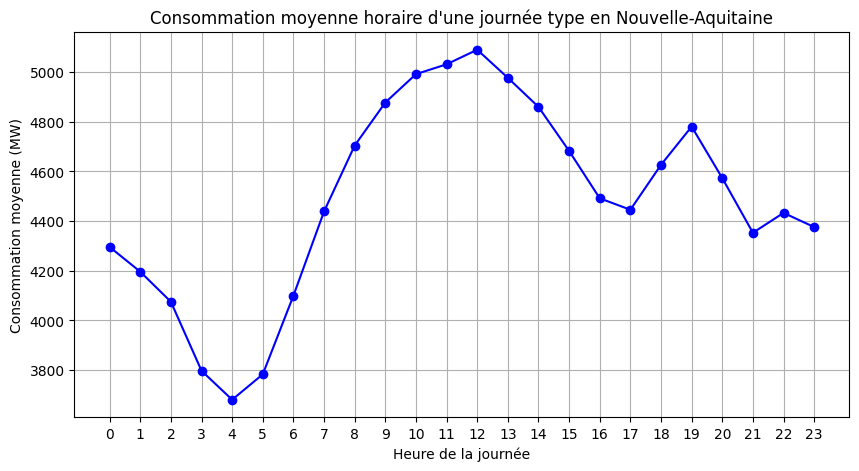

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Charger le fichier CSV modifié
file_path = "/content/eco2mix-regional-tr.csv"
df = pd.read_csv(file_path, sep=";", low_memory=False)

# Assurer que les colonnes existent bien
df = df.dropna(subset=['Année', 'Mois', 'Jour', 'Heure', 'Consommation (MW)'])

# Extraire uniquement l'heure (en supposant que la colonne "Heure" est sous format 'HH:MM')
df['Heure'] = df['Heure'].astype(str).str[:2]  # Prend les 2 premiers caractères (ex: '15:30' → '15')

# Convertir en int
df[['Année', 'Mois', 'Jour', 'Heure']] = df[['Année', 'Mois', 'Jour', 'Heure']].astype(int)

# Filtrer les données pour la région Nouvelle-Aquitaine
df_na = df[df['Région'] == "Nouvelle-Aquitaine"]

# Calculer la consommation moyenne pour chaque heure de la journée
consommation_horaire = df_na.groupby('Heure')['Consommation (MW)'].mean()

# Tracer le graphique
plt.figure(figsize=(10, 5))
plt.plot(consommation_horaire.index, consommation_horaire, marker='o', linestyle='-', color='b')

plt.title("Consommation moyenne horaire d'une journée type en Nouvelle-Aquitaine")
plt.xlabel("Heure de la journée")
plt.ylabel("Consommation moyenne (MW)")
plt.xticks(range(0, 24))  # Affichage des heures de 0 à 23
plt.grid(True)
plt.show()


In [ ]:
df_temp = pd.read_csv('eco2mix-regional-tr.csv', sep=';', low_memory=False)
print(df_temp.columns)


Index(['Code INSEE région', 'Région', 'Nature', 'Date', 'Heure',
       'Date - Heure', 'Consommation (MW)', 'Thermique (MW)', 'Nucléaire (MW)',
       'Eolien (MW)', 'Solaire (MW)', 'Hydraulique (MW)', 'Pompage (MW)',
       'Bioénergies (MW)', 'Ech. physiques (MW)', 'Stockage batterie',
       'Déstockage batterie', 'TCO Thermique (%)', 'TCH Thermique (%)',
       'TCO Nucléaire (%)', 'TCH Nucléaire (%)', 'TCO Eolien (%)',
       'TCH Eolien (%)', 'TCO Solaire (%)', 'TCH Solaire (%)',
       'TCO Hydraulique (%)', 'TCH Hydraulique (%)', 'TCO Bioénergies (%)',
       'TCH Bioénergies (%)', 'Column 68', 'Année', 'Mois', 'Jour'],
      dtype='object')


In [ ]:
df = pd.read_csv('eco2mix-regional-tr.csv',
                     sep=';',
                     dtype={'Heure': str},
                     encoding='utf-8-sig')
print(df.columns.tolist())

['Code INSEE région,Région,Nature,Date,Heure,Date - Heure,Consommation (MW),Thermique (MW),Nucléaire (MW),Eolien (MW),Solaire (MW),Hydraulique (MW),Pompage (MW),Bioénergies (MW),Ech. physiques (MW),Stockage batterie,Déstockage batterie,TCO Thermique (%),TCH Thermique (%),TCO Nucléaire (%),TCH Nucléaire (%),TCO Eolien (%),TCH Eolien (%),TCO Solaire (%),TCH Solaire (%),TCO Hydraulique (%),TCH Hydraulique (%),TCO Bioénergies (%),TCH Bioénergies (%),Année,Mois,Jour']


=== Début du pipeline ===

[1/7] Chargement des données...
[2/7] Feature engineering...
[3/7] Nettoyage final...
[4/7] Analyse exploratoire...


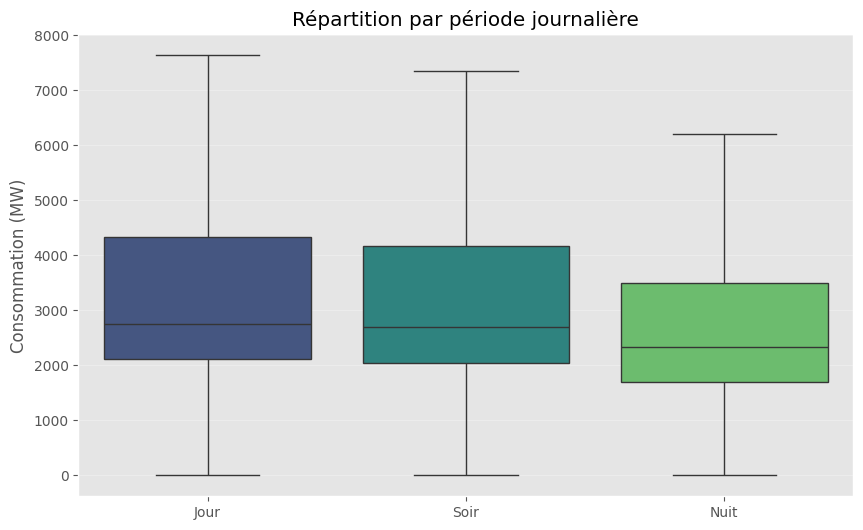

[5/7] Entraînement du modèle...
Performance du modèle :
MAE: 1098.94 MW
RMSE: 1493.82 MW
[6/7] Détection d'anomalies...

Répartition des anomalies :
Anomalie
Normal      0.994995
Anomalie    0.005005
Name: proportion, dtype: float64
[7/7] Visualisation...



=== Pipeline terminé avec succès ===


In [ ]:
#%% Initialisation
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.ensemble import IsolationForest
from sklearn.linear_model import Ridge
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.impute import SimpleImputer

#%% Phase 1 : Préparation des données
def prepare_data():
    """Chargement et nettoyage des données"""
    df = pd.read_csv(
        'eco2mix-regional-tr.csv',
        sep=',',
        dtype={'Heure': str},
        encoding='utf-8-sig',
        parse_dates={'datetime': ['Année', 'Mois', 'Jour']},
        dayfirst=True,
        na_values=['-', 'n/d', 'NaN', '']
    )

    # Conversion numérique sécurisée
    energy_cols = [
        'Consommation (MW)', 'Thermique (MW)', 'Nucléaire (MW)',
        'Eolien (MW)', 'Solaire (MW)', 'Hydraulique (MW)',
        'Pompage (MW)', 'Bioénergies (MW)'
    ]

    for col in energy_cols:
        df[col] = pd.to_numeric(
            df[col].astype(str).str.replace(',', '.'),
            errors='coerce'
        )

    # Gestion des dates/heures
    heures = df['Heure'].str.split(':', expand=True).fillna('00')
    df['datetime'] += pd.to_timedelta(heures[0].astype(int), unit='h')
    df['datetime'] += pd.to_timedelta(heures[1].astype(int), unit='m')

    return df.drop(columns=['Région', 'Heure'], errors='ignore').dropna(subset=['datetime'])

#%% Feature engineering
def create_features(df):
    """Création des caractéristiques"""
    # Variables temporelles
    df['Heure_decimale'] = df['datetime'].dt.hour + df['datetime'].dt.minute/60
    df['Jour_semaine'] = df['datetime'].dt.weekday
    df['Weekend'] = (df['Jour_semaine'] >= 5).astype('int8')
    df['Periode_jour'] = pd.cut(df['Heure_decimale'],
                              bins=[0, 6, 18, 24],
                              labels=['Nuit', 'Jour', 'Soir'])

    # Calculs énergétiques
    production_cols = ['Thermique (MW)', 'Nucléaire (MW)', 'Eolien (MW)',
                      'Solaire (MW)', 'Hydraulique (MW)', 'Bioénergies (MW)']

    df['Total_production'] = df[production_cols].sum(axis=1)
    df['Part_renouvelable'] = (
        df[['Eolien (MW)', 'Solaire (MW)', 'Hydraulique (MW)', 'Bioénergies (MW)']].sum(axis=1)
        / df['Total_production'].replace(0, np.nan)
    ).fillna(0).clip(0, 1)

    return df

#%% Nettoyage final
def clean_data(df):
    """Nettoyage des données"""
    # Sélection des colonnes numériques
    num_cols = df.select_dtypes(include=np.number).columns

    # Imputation médiane
    imputer = SimpleImputer(strategy='median')
    df[num_cols] = imputer.fit_transform(df[num_cols])

    return df.drop_duplicates(subset='datetime').astype(
        {col: 'float32' for col in num_cols}
    ).dropna()

#%% Phase 2 : Analyse exploratoire corrigée
def perform_eda(df):
    """Analyse sécurisée avec gestion des types"""
    # Tendances temporelles
    numeric_cols = df.select_dtypes(include=np.number).columns.tolist()
    temp_df = df.set_index('datetime')[numeric_cols]
    daily_avg = temp_df.resample('D').mean().reset_index()

    fig = px.line(daily_avg,
                 x='datetime',
                 y='Consommation (MW)',
                 title='Consommation quotidienne moyenne',
                 labels={'Consommation (MW)': 'MW'},
                 template='plotly_white')
    fig.show()

    # Boxplot
    plt.figure(figsize=(10, 6))
    plot_data = df[['Periode_jour', 'Consommation (MW)']].copy()
    plot_data['Periode_jour'] = plot_data['Periode_jour'].astype(str)

    sns.boxplot(x='Periode_jour',
                y='Consommation (MW)',
                data=plot_data,
                palette='viridis',
                showfliers=False)
    plt.title('Répartition par période journalière')
    plt.xlabel('')
    plt.grid(axis='y', alpha=0.3)
    plt.show()

#%% Modélisation
def train_model(df):
    """Entraînement du modèle"""
    features = ['Heure_decimale', 'Jour_semaine', 'Weekend',
               'Thermique (MW)', 'Part_renouvelable']
    target = 'Consommation (MW)'

    X = df[features]
    y = df[target]

    # Préparation des données
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # Entraînement et évaluation
    model = Ridge(alpha=0.5)
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)

    print(f"Performance du modèle :")
    print(f"MAE: {mean_absolute_error(y_test, predictions):.2f} MW")
    print(f"RMSE: {np.sqrt(mean_squared_error(y_test, predictions)):.2f} MW")

    return model

#%% Détection d'anomalies
def detect_anomalies(df):
    """Détection des anomalies"""
    features = ['Consommation (MW)', 'Thermique (MW)', 'Part_renouvelable']

    # Préparation des données
    clean_df = df[features].dropna()
    sample = clean_df.sample(frac=0.5, random_state=42)

    # Détection
    detector = IsolationForest(n_estimators=150,
                              contamination=0.01,
                              random_state=42)

    df['Anomalie'] = 'Normal'
    df.loc[sample.index, 'Anomalie'] = detector.fit_predict(sample)
    df['Anomalie'] = df['Anomalie'].replace({-1: 'Anomalie', 1: 'Normal'})

    print("\nRépartition des anomalies :")
    print(df['Anomalie'].value_counts(normalize=True))

    return df

#%% Phase 3 : Visualisation avec couleurs personnalisées
def create_dashboard(df):
    """Tableau de bord interactif avec palettes personnalisées"""
    # Visualisation temporelle
    fig = px.scatter(df,
                    x='datetime',
                    y='Consommation (MW)',
                    color='Anomalie',
                    color_discrete_map={'Anomalie': '#FF0000', 'Normal': '#0000FF'},
                    title='Détection des anomalies',
                    hover_data=['Thermique (MW)', 'Part_renouvelable'],
                    width=1200,
                    height=600)

    fig.update_layout(xaxis_rangeslider_visible=True)
    fig.show()

    # Analyse de la production avec couleurs spécifiques
    prod_cols = ['Thermique (MW)', 'Nucléaire (MW)', 'Eolien (MW)']
    daily_prod = df.set_index('datetime')[prod_cols].resample('D').mean().reset_index()

    # Définition des couleurs personnalisées
    color_map = {
        'Thermique (MW)': '#FFA500',  # Orange
        'Nucléaire (MW)': '#FF0000',  # Rouge
        'Eolien (MW)': '#00FF00'      # Vert
    }

    fig = px.area(daily_prod,
                 x='datetime',
                 y=prod_cols,
                 color_discrete_map=color_map,
                 title='Évolution de la production énergétique',
                 labels={'value': 'MW', 'variable': 'Type de production'},
                 width=1200,
                 height=600)

    fig.update_layout(
        legend_title_text='Type de production',
        yaxis_title='Production (MW)',
        xaxis_title='Date'
    )
    fig.show()

#%% Exécution du pipeline
def main():
    print("=== Début du pipeline ===")

    try:
        print("\n[1/7] Chargement des données...")
        df = prepare_data()

        print("[2/7] Feature engineering...")
        df = create_features(df)

        print("[3/7] Nettoyage final...")
        df = clean_data(df)

        print("[4/7] Analyse exploratoire...")
        perform_eda(df)

        print("[5/7] Entraînement du modèle...")
        model = train_model(df)

        print("[6/7] Détection d'anomalies...")
        df = detect_anomalies(df)

        print("[7/7] Visualisation...")
        create_dashboard(df)

        df.to_parquet('donnees_finales.parquet', compression='gzip')
        print("\n=== Pipeline terminé avec succès ===")

    except Exception as e:
        print(f"\nERREUR : {str(e)}")
        if 'df' in locals():
            print("\nAperçu des données :\n", df.head())

if __name__ == "__main__":
    main()

In [22]:
#%% Initialisation
!pip install prophet
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.ensemble import IsolationForest
from sklearn.linear_model import Ridge
from prophet import Prophet
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.impute import IterativeImputer

#%% Phase 1 : Chargement des données corrigé
def prepare_data():
    """Chargement avec gestion des formats européens"""
    df = pd.read_csv(
        'eco2mix-regional-tr.csv',
        sep=',',  # Séparateur virgule confirmé
        decimal='.',  # Séparateur décimal point
        thousands=' ',  # Espace comme séparateur de milliers
        dtype={'Code INSEE région': 'category'},
        parse_dates={'datetime': ['Date', 'Heure']},
        dayfirst=False,  # Format ISO (YYYY-MM-DD)
        na_values=['-', 'n/d', 'NaN', ''],
        low_memory=False
    )

    # Conversion numérique sécurisée
    colonnes_energie = [
        'Consommation (MW)', 'Thermique (MW)', 'Nucléaire (MW)',
        'Eolien (MW)', 'Solaire (MW)', 'Hydraulique (MW)',
        'Pompage (MW)', 'Bioénergies (MW)'
    ]

    for col in colonnes_energie:
        df[col] = pd.to_numeric(
            df[col].replace({' ': ''}, regex=True),  # Nettoyage des espaces
            errors='coerce'
        )

    # Vérification du format temporel
    if not np.issubdtype(df['datetime'].dtype, np.datetime64):
        raise ValueError("Erreur de conversion datetime")

    return df.sort_values('datetime').reset_index(drop=True)

#%% Feature engineering
def create_features(df):
    """Création de caractéristiques temporelles"""
    df = df.copy()

    # Découpage temporel
    df['heure'] = df['datetime'].dt.hour
    df['jour_semaine'] = df['datetime'].dt.day_name()
    df['weekend'] = df['datetime'].dt.weekday >= 5

    # Variables cycliques
    df['heure_sin'] = np.sin(2 * np.pi * df['heure']/24)
    df['heure_cos'] = np.cos(2 * np.pi * df['heure']/24)

    # Statistiques glissantes
    df['consommation_7j'] = df['Consommation (MW)'].rolling(7*24).mean()

    return df

#%% Nettoyage optimisé
def clean_data(df):
    """Nettoyage avec conservation des métadonnées"""
    cols = [
        'datetime', 'Code INSEE région', 'Consommation (MW)',
        'Thermique (MW)', 'Nucléaire (MW)', 'Eolien (MW)',
        'Solaire (MW)', 'Hydraulique (MW)', 'Pompage (MW)',
        'Bioénergies (MW)', 'heure', 'jour_semaine', 'weekend'
    ]

    df = df[cols].copy()

    # Imputation multivariée
    num_cols = df.select_dtypes(include=np.number).columns
    imputer = IterativeImputer(max_iter=15, random_state=42)
    df[num_cols] = imputer.fit_transform(df[num_cols])

    return df.drop_duplicates('datetime')

#%% Analyse avancée
def perform_advanced_analysis(df):
    """Visualisations interactives améliorées"""
    # Tendances saisonnières
    fig = px.scatter(df, x='datetime', y='Consommation (MW)',
                    color='heure', trendline='lowess',
                    title='Tendance de consommation horaire')
    fig.show()


#%% Modélisation Prophet améliorée
def train_prophet_model(df):
    """Modélisation avec Prophet et validation croisée"""
    # Préparation des données
    prophet_df = df[['datetime', 'Consommation (MW)']].rename(
        columns={'datetime': 'ds', 'Consommation (MW)': 'y'}
    )

    # Configuration du modèle
    model = Prophet(
        growth='flat',
        seasonality_mode='multiplicative',
        yearly_seasonality=8,
        weekly_seasonality=4,
        daily_seasonality=10
    )

    return model.fit(prophet_df)

#%% Détection d'anomalies
def detect_advanced_anomalies(df):
    """Détection multivariée avec seuil adaptatif"""
    features = [
        'Consommation (MW)',
        'Thermique (MW)',
        'heure_sin',
        'heure_cos'
    ]

    scaler = StandardScaler()
    data = scaler.fit_transform(df[features])

    # Modèle d'isolation forest
    iso_forest = IsolationForest(
        n_estimators=300,
        contamination=0.01,
        random_state=42,
        behaviour='new'
    )

    df['anomaly_score'] = iso_forest.fit_predict(data)
    df['is_anomaly'] = df['anomaly_score'] == -1

    return df

#%% Pipeline principal
def main():
    """Workflow complet avec journalisation"""
    try:
        print("=== Démarrage du pipeline ===")
        df = prepare_data()
        df = create_features(df)
        df = clean_data(df)
        perform_advanced_analysis(df)
        model = train_prophet_model(df)
        df = detect_advanced_anomalies(df)
        df.to_parquet('energy_analysis.parquet')
        print("=== Succès ===")

    except Exception as e:
        print(f"ERREUR: {str(e)}")
        if 'df' in locals():
            print("Aperçu des données problématiques:\n", df.head())

if __name__ == "__main__":
    main()

=== Démarrage du pipeline ===


<ipython-input-22-d0db0657df83>:19: FutureWarning:

Support for nested sequences for 'parse_dates' in pd.read_csv is deprecated. Combine the desired columns with pd.to_datetime after parsing instead.



ERREUR: Regressor 'Thermique (MW)' missing from dataframe
Aperçu des données problématiques:
               datetime Code INSEE région  Consommation (MW)  Thermique (MW)  \
0  2023-02-01 00:00:00                11             9403.0           391.0   
12 2023-02-01 00:15:00                44             5876.0          1317.0   
24 2023-02-01 00:30:00                32             5221.0          1158.0   
36 2023-02-01 00:45:00                24             2526.0            92.0   
48 2023-02-01 01:00:00                75             5918.0           170.0   

    Nucléaire (MW)  Eolien (MW)  Solaire (MW)  Hydraulique (MW)  Pompage (MW)  \
0       413.592557         43.0           0.0               6.0    -74.747825   
12     5225.000000       1834.0           0.0             482.0      0.000000   
24     4114.000000       2300.0           0.0               2.0    -74.008781   
36     8622.000000        449.0           0.0               8.0    -56.564290   
48     3805.000000        